In [1]:

# ============================================================================
# CELL 1: Installation
# ============================================================================
# Run this cell first to install required packages
!pip install yfinance pandas numpy matplotlib -q


In [2]:
# ============================================================================
# CELL 2: Import Libraries
# ============================================================================
import pandas as pd
import numpy as np
from datetime import datetime, timedelta
import time
from typing import Dict, List, Tuple
import warnings
import sys
warnings.filterwarnings('ignore')

# Configure display settings to prevent truncation
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.max_colwidth', None)

# For Jupyter notebooks - show all outputs
try:
    from IPython.core.interactiveshell import InteractiveShell
    InteractiveShell.ast_node_interactivity = "all"
    from IPython.display import display, HTML
    print("✅ Jupyter display configured")
except:
    print("✅ Console mode active")

# For real price data
try:
    import yfinance as yf
    YFINANCE_AVAILABLE = True
    print("✅ Yahoo Finance API loaded successfully")
except ImportError:
    YFINANCE_AVAILABLE = False
    print("⚠️  yfinance not installed. Run: pip install yfinance")

# For plotting
try:
    import matplotlib.pyplot as plt
    import matplotlib.patches as mpatches
    MATPLOTLIB_AVAILABLE = True
    print("✅ Matplotlib loaded successfully")
except ImportError:
    MATPLOTLIB_AVAILABLE = False
    print("⚠️  matplotlib not installed. Run: pip install matplotlib")

print(f"📅 Current Date: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")
print("✅ Display settings configured - Full output enabled")

✅ Jupyter display configured
✅ Yahoo Finance API loaded successfully
✅ Matplotlib loaded successfully
📅 Current Date: 2025-11-01 23:37:55
✅ Display settings configured - Full output enabled


In [3]:
# ============================================================================
# CELL 3: ForexAnalyzer Class Definition
# ============================================================================
class ForexAnalyzer:
    """
    Multi-timeframe forex analyzer for generating buy/sell recommendations
    Supports Gold (XAU/USD), Silver (XAG/USD), and other forex pairs
    Uses real price data from Yahoo Finance
    """
    
    def __init__(self, symbol: str):
        self.symbol = symbol
        self.timeframes = {
            '15m': '15m',
            '30m': '30m',
            '1h': '1h',
            '4h': '1h'  # We'll resample 1h to 4h
        }
        # Yahoo Finance ticker mapping
        self.ticker_map = {
            'XAU/USD': 'GC=F',  # Gold Futures
            'GOLD': 'GC=F',
            'XAG/USD': 'SI=F',  # Silver Futures
            'SILVER': 'SI=F',
            'EUR/USD': 'EURUSD=X',
            'GBP/USD': 'GBPUSD=X',
            'USD/JPY': 'JPY=X'
        }
        
    def get_yahoo_ticker(self) -> str:
        """Convert symbol to Yahoo Finance ticker"""
        return self.ticker_map.get(self.symbol, self.symbol)
    
    def fetch_price_data(self, timeframe: str, periods: int = 200) -> pd.DataFrame:
        """
        Fetch real historical price data from Yahoo Finance
        """
        if not YFINANCE_AVAILABLE:
            return self._generate_sample_data(timeframe, periods)
        
        try:
            ticker = self.get_yahoo_ticker()
            
            # Determine the period to fetch based on timeframe
            if timeframe == '15m':
                period = '5d'
                interval = '15m'
            elif timeframe == '30m':
                period = '7d'
                interval = '30m'
            elif timeframe == '1h':
                period = '1mo'
                interval = '1h'
            elif timeframe == '4h':
                period = '3mo'
                interval = '1h'
            else:
                period = '1mo'
                interval = '1h'
            
            # Fetch data from Yahoo Finance
            df = yf.download(ticker, period=period, interval=interval, progress=False)
            
            if df.empty:
                print(f"⚠️  No data returned for {ticker}. Using sample data.")
                return self._generate_sample_data(timeframe, periods)
            
            # Reset index to get the datetime as a column
            df.reset_index(inplace=True)
            
            # Clean up column names - handle both single and multi-level columns
            if isinstance(df.columns, pd.MultiIndex):
                df.columns = [col[0].lower() if isinstance(col, tuple) else col.lower() for col in df.columns]
            else:
                df.columns = [col.lower() for col in df.columns]
            
            # Rename columns to match our format
            if 'date' in df.columns:
                df.rename(columns={'date': 'timestamp'}, inplace=True)
            elif 'datetime' in df.columns:
                df.rename(columns={'datetime': 'timestamp'}, inplace=True)
            elif df.index.name and 'date' in str(df.index.name).lower():
                df.reset_index(inplace=True)
                df.rename(columns={df.columns[0]: 'timestamp'}, inplace=True)
            
            # If still no timestamp, use the index
            if 'timestamp' not in df.columns:
                df['timestamp'] = df.index
            
            # Resample to 4h if needed
            if timeframe == '4h':
                if 'timestamp' not in df.columns:
                    print(f"⚠️  Cannot resample without timestamp. Using sample data.")
                    return self._generate_sample_data(timeframe, periods)
                    
                df['timestamp'] = pd.to_datetime(df['timestamp'])
                df.set_index('timestamp', inplace=True)
                df = df.resample('4H').agg({
                    'open': 'first',
                    'high': 'max',
                    'low': 'min',
                    'close': 'last',
                    'volume': 'sum'
                }).dropna()
                df.reset_index(inplace=True)
            
            # Ensure we have the required columns
            required_cols = ['timestamp', 'open', 'high', 'low', 'close', 'volume']
            missing_cols = [col for col in required_cols if col not in df.columns]
            
            if missing_cols:
                print(f"⚠️  Missing columns: {missing_cols}. Available: {df.columns.tolist()}")
                print(f"⚠️  Using sample data for {ticker}")
                return self._generate_sample_data(timeframe, periods)
            
            print(f"✅ Fetched {len(df)} real data points for {ticker} ({timeframe})")
            return df
            
        except Exception as e:
            print(f"⚠️  Error fetching real data: {e}. Using sample data.")
            return self._generate_sample_data(timeframe, periods)
    
    def _generate_sample_data(self, timeframe: str, periods: int) -> pd.DataFrame:
        """Generate sample data when real data is unavailable"""
        np.random.seed(int(time.time()))
        base_price = 2000 if 'XAU' in self.symbol or 'GOLD' in self.symbol else 25
        freq_map = {'15m': '15T', '30m': '30T', '1h': '1H', '4h': '4H'}
        freq = freq_map.get(timeframe, '1H')
        dates = pd.date_range(end=datetime.now(), periods=periods, freq=freq)
        returns = np.random.normal(0.0001, 0.01, periods)
        prices = base_price * (1 + returns).cumprod()
        
        df = pd.DataFrame({
            'timestamp': dates,
            'open': prices * (1 + np.random.uniform(-0.002, 0.002, periods)),
            'high': prices * (1 + np.random.uniform(0, 0.005, periods)),
            'low': prices * (1 - np.random.uniform(0, 0.005, periods)),
            'close': prices,
            'volume': np.random.randint(1000, 10000, periods)
        })
        return df
    
    def calculate_indicators(self, df: pd.DataFrame) -> pd.DataFrame:
        """Calculate technical indicators"""
        # Moving Averages
        df['SMA_20'] = df['close'].rolling(window=20).mean()
        df['SMA_50'] = df['close'].rolling(window=50).mean()
        df['EMA_12'] = df['close'].ewm(span=12, adjust=False).mean()
        df['EMA_26'] = df['close'].ewm(span=26, adjust=False).mean()
        
        # MACD
        df['MACD'] = df['EMA_12'] - df['EMA_26']
        df['MACD_signal'] = df['MACD'].ewm(span=9, adjust=False).mean()
        df['MACD_histogram'] = df['MACD'] - df['MACD_signal']
        
        # RSI
        delta = df['close'].diff()
        gain = (delta.where(delta > 0, 0)).rolling(window=14).mean()
        loss = (-delta.where(delta < 0, 0)).rolling(window=14).mean()
        rs = gain / loss
        df['RSI'] = 100 - (100 / (1 + rs))
        
        # Bollinger Bands
        df['BB_middle'] = df['close'].rolling(window=20).mean()
        bb_std = df['close'].rolling(window=20).std()
        df['BB_upper'] = df['BB_middle'] + (bb_std * 2)
        df['BB_lower'] = df['BB_middle'] - (bb_std * 2)
        
        # ATR (Average True Range)
        high_low = df['high'] - df['low']
        high_close = np.abs(df['high'] - df['close'].shift())
        low_close = np.abs(df['low'] - df['close'].shift())
        ranges = pd.concat([high_low, high_close, low_close], axis=1)
        true_range = np.max(ranges, axis=1)
        df['ATR'] = true_range.rolling(14).mean()
        
        # Stochastic Oscillator
        low_14 = df['low'].rolling(window=14).min()
        high_14 = df['high'].rolling(window=14).max()
        df['Stoch_K'] = 100 * ((df['close'] - low_14) / (high_14 - low_14))
        df['Stoch_D'] = df['Stoch_K'].rolling(window=3).mean()
        
        return df
    
    def generate_signals(self, df: pd.DataFrame) -> Dict:
        """Generate buy/sell signals based on technical indicators"""
        latest = df.iloc[-1]
        signals = {'trend': 0, 'momentum': 0, 'volatility': 0, 'strength': 0}
        
        # Trend Analysis
        if latest['SMA_20'] > latest['SMA_50']:
            signals['trend'] += 1
        else:
            signals['trend'] -= 1
        if latest['close'] > latest['SMA_20']:
            signals['trend'] += 1
        else:
            signals['trend'] -= 1
        
        # MACD Signal
        if latest['MACD'] > latest['MACD_signal']:
            signals['momentum'] += 1
        else:
            signals['momentum'] -= 1
        if latest['MACD_histogram'] > 0:
            signals['momentum'] += 0.5
        else:
            signals['momentum'] -= 0.5
        
        # RSI Analysis
        if latest['RSI'] < 30:
            signals['strength'] += 2
        elif latest['RSI'] < 40:
            signals['strength'] += 1
        elif latest['RSI'] > 70:
            signals['strength'] -= 2
        elif latest['RSI'] > 60:
            signals['strength'] -= 1
        
        # Bollinger Bands
        if latest['close'] < latest['BB_lower']:
            signals['volatility'] += 1
        elif latest['close'] > latest['BB_upper']:
            signals['volatility'] -= 1
        
        # Stochastic
        if latest['Stoch_K'] < 20 and latest['Stoch_K'] > latest['Stoch_D']:
            signals['momentum'] += 1
        elif latest['Stoch_K'] > 80 and latest['Stoch_K'] < latest['Stoch_D']:
            signals['momentum'] -= 1
        
        return signals
    
    def analyze_timeframe(self, timeframe: str) -> Dict:
        """Analyze a single timeframe"""
        df = self.fetch_price_data(timeframe)
        df = self.calculate_indicators(df)
        signals = self.generate_signals(df)
        total_score = sum(signals.values())
        
        # Determine recommendation
        if total_score >= 3:
            recommendation = "STRONG BUY"
        elif total_score >= 1:
            recommendation = "BUY"
        elif total_score <= -3:
            recommendation = "STRONG SELL"
        elif total_score <= -1:
            recommendation = "SELL"
        else:
            recommendation = "HOLD"
        
        latest = df.iloc[-1]
        
        # Calculate price targets and stop loss
        atr = latest['ATR']
        current_price = latest['close']
        
        # Buy price range (support levels)
        buy_range = {
            'strong_buy': round(latest['BB_lower'], 2),
            'buy_zone_low': round(current_price - (1.5 * atr), 2),
            'buy_zone_high': round(current_price - (0.5 * atr), 2)
        }
        
        # Sell price range (resistance levels)
        sell_range = {
            'sell_zone_low': round(current_price + (0.5 * atr), 2),
            'sell_zone_high': round(current_price + (1.5 * atr), 2),
            'strong_sell': round(latest['BB_upper'], 2)
        }
        
        # Risk management levels
        if recommendation in ["BUY", "STRONG BUY"]:
            # For long positions
            stop_loss = round(current_price - (2 * atr), 2)
            stop_loss_tight = round(current_price - (1 * atr), 2)
            stop_loss_wide = round(current_price - (3 * atr), 2)
            take_profit_1 = round(current_price + (1 * atr), 2)
            take_profit_2 = round(current_price + (2 * atr), 2)
            take_profit_3 = round(current_price + (3 * atr), 2)
            take_profit_4 = round(current_price + (5 * atr), 2)
            
            # Calculate potential loss and gain
            potential_loss = current_price - stop_loss
            potential_gain_1 = take_profit_1 - current_price
            risk_reward_1 = round(potential_gain_1 / potential_loss, 2) if potential_loss > 0 else None
            
        elif recommendation in ["SELL", "STRONG SELL"]:
            # For short positions
            stop_loss = round(current_price + (2 * atr), 2)
            stop_loss_tight = round(current_price + (1 * atr), 2)
            stop_loss_wide = round(current_price + (3 * atr), 2)
            take_profit_1 = round(current_price - (1 * atr), 2)
            take_profit_2 = round(current_price - (2 * atr), 2)
            take_profit_3 = round(current_price - (3 * atr), 2)
            take_profit_4 = round(current_price - (5 * atr), 2)
            
            # Calculate potential loss and gain
            potential_loss = stop_loss - current_price
            potential_gain_1 = current_price - take_profit_1
            risk_reward_1 = round(potential_gain_1 / potential_loss, 2) if potential_loss > 0 else None
            
        else:
            # For HOLD recommendation
            stop_loss = round(current_price - (2 * atr), 2)
            stop_loss_tight = round(current_price - (1 * atr), 2)
            stop_loss_wide = round(current_price - (3 * atr), 2)
            take_profit_1 = None
            take_profit_2 = None
            take_profit_3 = None
            take_profit_4 = None
            risk_reward_1 = None
        
        # Calculate percentage-based stop loss
        stop_loss_pct_2 = round(current_price * 0.98, 2)  # 2% stop loss
        stop_loss_pct_3 = round(current_price * 0.97, 2)  # 3% stop loss
        stop_loss_pct_5 = round(current_price * 0.95, 2)  # 5% stop loss
        
        return {
            'timeframe': timeframe,
            'price': latest['close'],
            'open': latest['open'],
            'high': latest['high'],
            'low': latest['low'],
            'signals': signals,
            'score': total_score,
            'recommendation': recommendation,
            'buy_range': buy_range,
            'sell_range': sell_range,
            'stop_loss': {
                'atr_based': stop_loss,
                'tight_1atr': stop_loss_tight,
                'wide_3atr': stop_loss_wide,
                'percentage_2pct': stop_loss_pct_2,
                'percentage_3pct': stop_loss_pct_3,
                'percentage_5pct': stop_loss_pct_5
            },
            'take_profit': {
                'tp1_scalp': take_profit_1,
                'tp2_conservative': take_profit_2,
                'tp3_moderate': take_profit_3,
                'tp4_aggressive': take_profit_4
            },
            'risk_reward_ratio': risk_reward_1,
            'position_sizing': {
                'risk_per_trade': '1-2% of account',
                'max_loss_amount': f"${round(abs(current_price - stop_loss), 2)} per unit",
                'suggested_lot': 'Calculate based on account size'
            },
            'indicators': {
                'RSI': round(latest['RSI'], 2),
                'MACD': round(latest['MACD'], 4),
                'Stoch_K': round(latest['Stoch_K'], 2),
                'ATR': round(latest['ATR'], 4),
                'SMA_20': round(latest['SMA_20'], 2),
                'SMA_50': round(latest['SMA_50'], 2)
            },
            'timestamp': latest['timestamp']
        }
    
    def multi_timeframe_analysis(self) -> Dict:
        """Perform analysis across multiple timeframes"""
        results = {}
        
        for tf in self.timeframes.keys():
            results[tf] = self.analyze_timeframe(tf)
        
        # Calculate consensus recommendation
        scores = [results[tf]['score'] for tf in self.timeframes.keys()]
        avg_score = np.mean(scores)
        
        if avg_score >= 2.5:
            consensus = "STRONG BUY"
        elif avg_score >= 1:
            consensus = "BUY"
        elif avg_score <= -2.5:
            consensus = "STRONG SELL"
        elif avg_score <= -1:
            consensus = "SELL"
        else:
            consensus = "HOLD"
        
        # Get daily data for OHLC
        daily_data = self.get_daily_ohlc()
        
        return {
            'symbol': self.symbol,
            'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
            'daily': daily_data,
            'timeframes': results,
            'consensus': consensus,
            'average_score': round(avg_score, 2)
        }
    
    def get_daily_ohlc(self) -> Dict:
        """Get daily OHLC data"""
        try:
            ticker = self.get_yahoo_ticker()
            df = yf.download(ticker, period='5d', interval='1d', progress=False)
            
            if df.empty:
                return None
            
            df.reset_index(inplace=True)
            
            # Handle column names
            if isinstance(df.columns, pd.MultiIndex):
                df.columns = [col[0].lower() if isinstance(col, tuple) else col.lower() for col in df.columns]
            else:
                df.columns = [col.lower() for col in df.columns]
            
            latest = df.iloc[-1]
            previous = df.iloc[-2] if len(df) > 1 else latest
            
            change = latest['close'] - previous['close']
            change_pct = (change / previous['close']) * 100
            
            return {
                'date': latest.get('date', latest.get('datetime', datetime.now())),
                'open': round(latest['open'], 2),
                'high': round(latest['high'], 2),
                'low': round(latest['low'], 2),
                'close': round(latest['close'], 2),
                'volume': int(latest['volume']) if 'volume' in latest else 0,
                'change': round(change, 2),
                'change_pct': round(change_pct, 2),
                'day_range': f"${round(latest['low'], 2)} - ${round(latest['high'], 2)}"
            }
        except Exception as e:
            print(f"⚠️  Error fetching daily data: {e}")
            return None


def print_analysis(analysis: Dict):
    """Pretty print the analysis results"""
    print("=" * 90)
    print(f"FOREX TRADING ANALYSIS - {analysis['symbol']}")
    print(f"Analysis Time: {analysis['timestamp']}")
    print("=" * 90)
    
    # Daily OHLC Summary
    if analysis.get('daily'):
        daily = analysis['daily']
        print("\n📅 DAILY SUMMARY:")
        print(f"   Date: {daily['date']}")
        print(f"   Open:  ${daily['open']:,.2f}")
        print(f"   High:  ${daily['high']:,.2f}")
        print(f"   Low:   ${daily['low']:,.2f}")
        print(f"   Close: ${daily['close']:,.2f}")
        print(f"   Volume: {daily['volume']:,}")
        print(f"   Day Range: {daily['day_range']}")
        change_symbol = "📈" if daily['change'] > 0 else "📉" if daily['change'] < 0 else "➡️"
        print(f"   Change: {change_symbol} ${daily['change']:+,.2f} ({daily['change_pct']:+.2f}%)")
    print()
    
    for tf, data in analysis['timeframes'].items():
        print(f"{'='*90}")
        print(f"📊 {tf.upper()} TIMEFRAME ANALYSIS")
        print(f"{'='*90}")
        print(f"\n💰 CURRENT PRICE LEVELS:")
        print(f"   Open:  ${data['open']:.2f}")
        print(f"   High:  ${data['high']:.2f}")
        print(f"   Low:   ${data['low']:.2f}")
        print(f"   Close: ${data['price']:.2f}")
        
        print(f"\n🎯 RECOMMENDATION: {data['recommendation']}")
        print(f"   Signal Score: {data['score']}")
        
        print(f"\n📊 SIGNAL BREAKDOWN:")
        for signal_type, value in data['signals'].items():
            indicator = "🟢" if value > 0 else "🔴" if value < 0 else "⚪"
            print(f"   {indicator} {signal_type.capitalize()}: {value:+.1f}")
        
        print(f"\n💵 BUY PRICE RANGES:")
        print(f"   🟢 Strong Buy Zone:  ${data['buy_range']['strong_buy']:.2f} (BB Lower)")
        print(f"   🟡 Buy Zone Low:     ${data['buy_range']['buy_zone_low']:.2f}")
        print(f"   🟡 Buy Zone High:    ${data['buy_range']['buy_zone_high']:.2f}")
        
        print(f"\n💵 SELL PRICE RANGES:")
        print(f"   🟡 Sell Zone Low:    ${data['sell_range']['sell_zone_low']:.2f}")
        print(f"   🟡 Sell Zone High:   ${data['sell_range']['sell_zone_high']:.2f}")
        print(f"   🔴 Strong Sell Zone: ${data['sell_range']['strong_sell']:.2f} (BB Upper)")
        
        if data.get('stop_loss'):
            sl = data['stop_loss']
            tp = data['take_profit']
            
            print(f"\n🛑 STOP LOSS LEVELS:")
            print(f"   Tight (1 ATR):       ${sl['tight_1atr']:.2f} - Quick exit, less risk")
            print(f"   📍 Standard (2 ATR):  ${sl['atr_based']:.2f} - Recommended")
            print(f"   Wide (3 ATR):        ${sl['wide_3atr']:.2f} - More room, more risk")
            print(f"\n   💯 Percentage-Based Stop Loss:")
            print(f"   2% Stop Loss:        ${sl['percentage_2pct']:.2f}")
            print(f"   3% Stop Loss:        ${sl['percentage_3pct']:.2f}")
            print(f"   5% Stop Loss:        ${sl['percentage_5pct']:.2f}")
            
            if tp['tp1_scalp']:
                print(f"\n🎯 TAKE PROFIT TARGETS:")
                print(f"   TP1 (1 ATR):         ${tp['tp1_scalp']:.2f} - Scalp/Quick (25% position)")
                print(f"   TP2 (2 ATR):         ${tp['tp2_conservative']:.2f} - Conservative (25% position)")
                print(f"   TP3 (3 ATR):         ${tp['tp3_moderate']:.2f} - Moderate (25% position)")
                print(f"   TP4 (5 ATR):         ${tp['tp4_aggressive']:.2f} - Aggressive (25% - let it run!)")
                
                # Calculate profit potential at each TP
                entry = data['price']
                print(f"\n   💰 Profit Potential per Unit:")
                if data['recommendation'] in ["BUY", "STRONG BUY"]:
                    print(f"      At TP1: ${tp['tp1_scalp'] - entry:.2f} ({((tp['tp1_scalp'] - entry) / entry * 100):.2f}%)")
                    print(f"      At TP2: ${tp['tp2_conservative'] - entry:.2f} ({((tp['tp2_conservative'] - entry) / entry * 100):.2f}%)")
                    print(f"      At TP3: ${tp['tp3_moderate'] - entry:.2f} ({((tp['tp3_moderate'] - entry) / entry * 100):.2f}%)")
                    print(f"      At TP4: ${tp['tp4_aggressive'] - entry:.2f} ({((tp['tp4_aggressive'] - entry) / entry * 100):.2f}%)")
                else:
                    print(f"      At TP1: ${entry - tp['tp1_scalp']:.2f} ({((entry - tp['tp1_scalp']) / entry * 100):.2f}%)")
                    print(f"      At TP2: ${entry - tp['tp2_conservative']:.2f} ({((entry - tp['tp2_conservative']) / entry * 100):.2f}%)")
                    print(f"      At TP3: ${entry - tp['tp3_moderate']:.2f} ({((entry - tp['tp3_moderate']) / entry * 100):.2f}%)")
                    print(f"      At TP4: ${entry - tp['tp4_aggressive']:.2f} ({((entry - tp['tp4_aggressive']) / entry * 100):.2f}%)")
            
            if data['risk_reward_ratio']:
                rr = data['risk_reward_ratio']
                quality = "Excellent" if rr >= 2 else "Good" if rr >= 1.5 else "Fair" if rr >= 1 else "Poor"
                print(f"\n📊 RISK/REWARD ANALYSIS:")
                print(f"   Risk/Reward Ratio:   1:{rr} ({quality})")
                print(f"   Max Risk per Unit:   ${data['position_sizing']['max_loss_amount']}")
                print(f"   Recommended Risk:    {data['position_sizing']['risk_per_trade']}")
                
                # Position sizing example
                print(f"\n💰 POSITION SIZING EXAMPLE:")
                print(f"   Account Size: $10,000")
                print(f"   Risk per Trade (2%): $200")
                risk_per_unit = abs(data['price'] - sl['atr_based'])
                if risk_per_unit > 0:
                    units = 200 / risk_per_unit
                    print(f"   Suggested Units: {units:.2f} (to risk $200)")
                    print(f"   Total Position Value: ${data['price'] * units:,.2f}")
        
        print(f"\n📈 KEY INDICATORS:")
        for ind, val in data['indicators'].items():
            print(f"   {ind}: {val}")
        print()
    
    print("=" * 90)
    print(f"🎯 CONSENSUS RECOMMENDATION: {analysis['consensus']}")
    print(f"📈 Average Score: {analysis['average_score']}")
    print("=" * 90)


In [4]:
# ============================================================================
# CELL 3B: Visualization Functions
# ============================================================================
def plot_trading_chart(analysis: Dict, timeframe: str, save_path: str = None):
    """Create a trading chart with entry, stop loss, and take profit levels"""
    if not MATPLOTLIB_AVAILABLE:
        print("⚠️  Matplotlib not available. Cannot create charts.")
        return
    
    try:

        SL_LABEL_OFFSET = 0.006       # More space from stop loss line
        TP_LABEL_OFFSET_UP = 1.02    # TP labels further up
        TP_LABEL_OFFSET_DOWN = 0.992  # TP labels further down

        # Move buy zone label lower
        BUY_ZONE_LABEL_POSITION = 0.35  # 35% from bottom

        # Move sell zone label higher
        SELL_ZONE_LABEL_POSITION = 0.65  # 65% from bottom

        # Spread them out more
        ENTRY1_Y_OFFSET = 90   # Further from entry point
        ENTRY2_Y_OFFSET = 70   # Further from entry point
        ENTRY3_Y_OFFSET = 75   # Further from entry point

        tf_data = analysis['timeframes'][timeframe]
        symbol = analysis['symbol']
        
        # Fetch price data for the chart
        analyzer = ForexAnalyzer(symbol)
        df = analyzer.fetch_price_data(timeframe, periods=100)
        
        if df.empty or len(df) < 10:
            print(f"⚠️  Insufficient data for {symbol} {timeframe} chart")
            return
        
        # Calculate indicators if not present
        if 'RSI' not in df.columns:
            df = analyzer.calculate_indicators(df)
        
        # Create figure
        fig, ax1 = plt.subplots(1, 1, figsize=(20, 12))
        
        # Get recommendation and colors
        recommendation = tf_data['recommendation']
        rec_color = '#06D6A0' if 'BUY' in recommendation else '#EF476F' if 'SELL' in recommendation else '#FFD166'
        
        # Calculate trend
        trend_score = tf_data['signals']['trend']
        trend_text = "UPTREND ↗" if trend_score > 0 else "DOWNTREND ↘" if trend_score < 0 else "SIDEWAYS →"
        
        # Main title at very top
        fig.text(0.5, 0.98, f'{symbol} - {timeframe.upper()} TIMEFRAME', 
                ha='center', fontsize=22, fontweight='bold', va='top')
        
        # Recommendation box - LARGER and SEPARATE
        fig.text(0.5, 0.945, f'⚡ RECOMMENDATION: {recommendation} ⚡', 
                ha='center', va='center', fontsize=18, fontweight='bold', color='white',
                bbox=dict(boxstyle='round,pad=1.0', facecolor=rec_color, 
                         edgecolor='black', linewidth=4))
        
        # Price summary - BELOW recommendation with MORE SPACE
        daily = analysis.get('daily', {})
        if daily:
            subtitle = f'Current: ${tf_data["price"]:.2f}  |  Daily Change: {daily.get("change_pct", 0):+.2f}%  |  Trend: {trend_text}  |  Score: {tf_data["score"]}'
        else:
            subtitle = f'Current: ${tf_data["price"]:.2f}  |  Trend: {trend_text}  |  Score: {tf_data["score"]}'
        
        fig.text(0.5, 0.900, subtitle, ha='center', va='center', fontsize=12,
                bbox=dict(boxstyle='round,pad=0.6', facecolor='lightyellow', 
                         edgecolor='gray', linewidth=2, alpha=0.95))
        
        # Main price chart
        ax1.plot(df.index, df['close'], label='Close Price', color='#2E86AB', linewidth=2.5, zorder=3)
        
        # Plot moving averages
        if 'SMA_20' in df.columns and not df['SMA_20'].isna().all():
            ax1.plot(df.index, df['SMA_20'], label='SMA 20', color='#FF6B35', 
                    linewidth=2, alpha=0.8, zorder=2)
        if 'SMA_50' in df.columns and not df['SMA_50'].isna().all():
            ax1.plot(df.index, df['SMA_50'], label='SMA 50', color='#A35EFF', 
                    linewidth=2, alpha=0.8, zorder=2)
        
        # Plot Bollinger Bands
        if 'BB_upper' in df.columns and not df['BB_upper'].isna().all():
            ax1.fill_between(df.index, df['BB_lower'], df['BB_upper'], 
                            alpha=0.15, color='#73C2FB', label='Bollinger Bands', zorder=1)
            ax1.plot(df.index, df['BB_upper'], color='#118AB2', linewidth=1, 
                    linestyle='--', alpha=0.6)
            ax1.plot(df.index, df['BB_lower'], color='#118AB2', linewidth=1, 
                    linestyle='--', alpha=0.6)
        
        # Current price and entry points
        current_price = tf_data['price']
        last_idx = len(df) - 1
        
        # Get entry zones
        buy_range = tf_data.get('buy_range', {})
        sell_range = tf_data.get('sell_range', {})
        
        # SHOW ALL 3 ENTRY POINTS
        if recommendation in ["BUY", "STRONG BUY"]:
            # Entry 1: Current price (immediate entry)
            ax1.scatter(last_idx, current_price, color='#06D6A0', s=600, 
                       marker='^', zorder=10, edgecolors='black', linewidth=3)
            
            ax1.annotate(f'ENTRY 1\n(NOW)\n${current_price:.2f}', 
                        xy=(last_idx, current_price),
                        xytext=(20, 40),
                        textcoords='offset points',
                        fontsize=12, fontweight='bold', color='white',
                        bbox=dict(boxstyle='round,pad=0.7', facecolor='#06D6A0', 
                                 edgecolor='black', linewidth=3),
                        arrowprops=dict(arrowstyle='->', color='#06D6A0', lw=3))
            
            # Entry 2: Buy zone high
            if buy_range.get('buy_zone_high'):
                entry2_price = buy_range['buy_zone_high']
                entry2_idx = last_idx - 8
                ax1.scatter(entry2_idx, entry2_price, color='#45B369', s=450, 
                           marker='^', zorder=9, edgecolors='black', linewidth=3)
                ax1.annotate(f'ENTRY 2\n${entry2_price:.2f}', 
                            xy=(entry2_idx, entry2_price),
                            xytext=(-60, 30),
                            textcoords='offset points',
                            fontsize=11, fontweight='bold', color='white',
                            bbox=dict(boxstyle='round,pad=0.6', facecolor='#45B369', 
                                     edgecolor='black', linewidth=2.5),
                            arrowprops=dict(arrowstyle='->', color='#45B369', lw=2.5))
            
            # Entry 3: Buy zone low (best entry)
            if buy_range.get('buy_zone_low'):
                entry3_price = buy_range['buy_zone_low']
                entry3_idx = last_idx - 16
                ax1.scatter(entry3_idx, entry3_price, color='#228B22', s=450, 
                           marker='^', zorder=9, edgecolors='black', linewidth=3)
                ax1.annotate(f'ENTRY 3\n(BEST)\n${entry3_price:.2f}', 
                            xy=(entry3_idx, entry3_price),
                            xytext=(-60, -40),
                            textcoords='offset points',
                            fontsize=11, fontweight='bold', color='white',
                            bbox=dict(boxstyle='round,pad=0.6', facecolor='#228B22', 
                                     edgecolor='black', linewidth=2.5),
                            arrowprops=dict(arrowstyle='->', color='#228B22', lw=2.5))
                    
        elif recommendation in ["SELL", "STRONG SELL"]:
            # Entry 1: Current price
            ax1.scatter(last_idx, current_price, color='#EF476F', s=600, 
                       marker='v', zorder=10, edgecolors='black', linewidth=3)
            
            ax1.annotate(f'ENTRY 1\n(NOW)\n${current_price:.2f}', 
                        xy=(last_idx, current_price),
                        xytext=(20, -40),
                        textcoords='offset points',
                        fontsize=12, fontweight='bold', color='white',
                        bbox=dict(boxstyle='round,pad=0.7', facecolor='#EF476F', 
                                 edgecolor='black', linewidth=3),
                        arrowprops=dict(arrowstyle='->', color='#EF476F', lw=3))
            
            # Entry 2: Sell zone low
            if sell_range.get('sell_zone_low'):
                entry2_price = sell_range['sell_zone_low']
                entry2_idx = last_idx - 8
                ax1.scatter(entry2_idx, entry2_price, color='#DC143C', s=450, 
                           marker='v', zorder=9, edgecolors='black', linewidth=3)
                ax1.annotate(f'ENTRY 2\n${entry2_price:.2f}', 
                            xy=(entry2_idx, entry2_price),
                            xytext=(-60, -30),
                            textcoords='offset points',
                            fontsize=11, fontweight='bold', color='white',
                            bbox=dict(boxstyle='round,pad=0.6', facecolor='#DC143C', 
                                     edgecolor='black', linewidth=2.5),
                            arrowprops=dict(arrowstyle='->', color='#DC143C', lw=2.5))
            
            # Entry 3: Sell zone high (best short)
            if sell_range.get('sell_zone_high'):
                entry3_price = sell_range['sell_zone_high']
                entry3_idx = last_idx - 16
                ax1.scatter(entry3_idx, entry3_price, color='#8B0000', s=450, 
                           marker='v', zorder=9, edgecolors='black', linewidth=3)
                ax1.annotate(f'ENTRY 3\n(BEST)\n${entry3_price:.2f}', 
                            xy=(entry3_idx, entry3_price),
                            xytext=(-60, 40),
                            textcoords='offset points',
                            fontsize=11, fontweight='bold', color='white',
                            bbox=dict(boxstyle='round,pad=0.6', facecolor='#8B0000', 
                                     edgecolor='black', linewidth=2.5),
                            arrowprops=dict(arrowstyle='->', color='#8B0000', lw=2.5))
        else:
            # HOLD
            ax1.scatter(last_idx, current_price, color='#FFD166', s=500, 
                       marker='o', zorder=10, edgecolors='black', linewidth=3)
            ax1.annotate(f'HOLD\n${current_price:.2f}', 
                        xy=(last_idx, current_price),
                        xytext=(20, 0),
                        textcoords='offset points',
                        fontsize=12, fontweight='bold', color='black',
                        bbox=dict(boxstyle='round,pad=0.7', facecolor='#FFD166', 
                                 edgecolor='black', linewidth=3),
                        arrowprops=dict(arrowstyle='->', color='#FFD166', lw=3))
        
        # Stop Loss
        sl = tf_data.get('stop_loss', {})
        if sl.get('atr_based'):
            sl_price = sl['atr_based']
            ax1.axhline(y=sl_price, color='#EF476F', linestyle='--', 
                       linewidth=3.5, zorder=5)
            
            ax1.text(len(df) * 0.03, sl_price, f'  🛑 STOP LOSS: ${sl_price:.2f}  ',
                    verticalalignment='center', horizontalalignment='left',
                    fontsize=12, fontweight='bold', color='white',
                    bbox=dict(boxstyle='round,pad=0.7', facecolor='#EF476F', 
                             edgecolor='black', linewidth=3))
        
        # Take Profits - stagger positions
        tp = tf_data.get('take_profit', {})
        tp_configs = [
            ('tp1_scalp', 'TP1', '#06D6A0', 3.5),
            ('tp2_conservative', 'TP2', '#26C485', 3),
            ('tp3_moderate', 'TP3', '#45B369', 3),
            ('tp4_aggressive', 'TP4', '#64A24E', 3)
        ]
        
        for idx, (tp_key, tp_label, color, linewidth) in enumerate(tp_configs):
            if tp.get(tp_key):
                tp_price = tp[tp_key]
                ax1.axhline(y=tp_price, color=color, linestyle='--', 
                           linewidth=linewidth, alpha=0.9, zorder=4)
                
                # Alternate left and right
                if idx % 2 == 0:
                    x_pos = len(df) * 0.97
                    h_align = 'right'
                else:
                    x_pos = len(df) * 0.03
                    h_align = 'left'
                
                ax1.text(x_pos, tp_price, f'  🎯 {tp_label}: ${tp_price:.2f}  ',
                        verticalalignment='center', horizontalalignment=h_align,
                        fontsize=11, fontweight='bold', color='white',
                        bbox=dict(boxstyle='round,pad=0.6', facecolor=color, 
                                edgecolor='black', linewidth=2.5))
        
        # Buy/Sell zones
        if buy_range.get('buy_zone_low') and buy_range.get('buy_zone_high'):
            buy_low = buy_range['buy_zone_low']
            buy_high = buy_range['buy_zone_high']
            ax1.axhspan(buy_low, buy_high, alpha=0.15, color='green', zorder=1)
            
            zone_mid = (buy_low + buy_high) / 2
            ax1.text(len(df) * 0.5, zone_mid, f'BUY ZONE: ${buy_low:.2f} - ${buy_high:.2f}',
                    verticalalignment='center', horizontalalignment='center',
                    fontsize=12, color='white', fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.6', facecolor='darkgreen', 
                             edgecolor='white', linewidth=2.5, alpha=0.9))
        
        if sell_range.get('sell_zone_low') and sell_range.get('sell_zone_high'):
            sell_low = sell_range['sell_zone_low']
            sell_high = sell_range['sell_zone_high']
            ax1.axhspan(sell_low, sell_high, alpha=0.15, color='red', zorder=1)
            
            zone_mid = (sell_low + sell_high) / 2
            ax1.text(len(df) * 0.5, zone_mid, f'SELL ZONE: ${sell_low:.2f} - ${sell_high:.2f}',
                    verticalalignment='center', horizontalalignment='center',
                    fontsize=12, color='white', fontweight='bold',
                    bbox=dict(boxstyle='round,pad=0.6', facecolor='darkred', 
                             edgecolor='white', linewidth=2.5, alpha=0.9))
        
        # Info boxes
        indicators = tf_data['indicators']
        stats_text = f"📊 INDICATORS\n"
        stats_text += f"RSI: {indicators['RSI']:.1f}\n"
        stats_text += f"MACD: {indicators['MACD']:.4f}\n"
        stats_text += f"ATR: {indicators['ATR']:.2f}\n"
        stats_text += f"Stoch: {indicators['Stoch_K']:.1f}"
        
        ax1.text(0.01, 0.98, stats_text, transform=ax1.transAxes,
                fontsize=11, verticalalignment='top', horizontalalignment='left',
                bbox=dict(boxstyle='round,pad=0.7', facecolor='lightblue', 
                         edgecolor='black', linewidth=2.5, alpha=0.95),
                family='monospace', fontweight='bold')
        
        if sl.get('atr_based') and tp.get('tp1_scalp'):
            risk_reward = tf_data.get('risk_reward_ratio', 'N/A')
            trade_info = f"💰 TRADE SETUP\n"
            trade_info += f"Entry: ${current_price:.2f}\n"
            trade_info += f"Stop: ${sl['atr_based']:.2f}\n"
            trade_info += f"Target: ${tp['tp1_scalp']:.2f}\n"
            trade_info += f"R:R = 1:{risk_reward}"
            
            ax1.text(0.01, 0.02, trade_info, transform=ax1.transAxes,
                    fontsize=11, verticalalignment='bottom', horizontalalignment='left',
                    bbox=dict(boxstyle='round,pad=0.7', facecolor='lightyellow', 
                             edgecolor='black', linewidth=2.5, alpha=0.95),
                    family='monospace', fontweight='bold')
        
        entry_explanation = "📍 ENTRY POINTS:\n"
        entry_explanation += "• Entry 1: NOW (current price)\n"
        entry_explanation += "• Entry 2: Better (pullback)\n"
        entry_explanation += "• Entry 3: BEST (optimal zone)"
        
        ax1.text(0.99, 0.98, entry_explanation, transform=ax1.transAxes,
                fontsize=10, verticalalignment='top', horizontalalignment='right',
                bbox=dict(boxstyle='round,pad=0.7', facecolor='lavender', 
                         edgecolor='black', linewidth=2.5, alpha=0.95),
                family='monospace', fontweight='bold')
        
        ax1.set_ylabel('Price ($)', fontsize=15, fontweight='bold')
        ax1.set_xlabel('Time Period', fontsize=15, fontweight='bold')
        ax1.legend(loc='upper left', fontsize=10, ncol=2, framealpha=0.95, 
                  bbox_to_anchor=(0, 0.82))
        ax1.grid(True, alpha=0.3, linestyle='--', linewidth=0.5)
        ax1.yaxis.set_major_formatter(plt.FuncFormatter(lambda y, _: f'${y:.2f}'))
        
        fig.text(0.5, 0.005, f'Generated: {datetime.now().strftime("%Y-%m-%d %H:%M:%S")}', 
                ha='center', fontsize=10, color='gray', style='italic')
        
        plt.tight_layout(rect=[0, 0.015, 1, 0.87])
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight', facecolor='white')
            print(f"✅ Chart saved: {save_path}")
        
        plt.show()
        plt.close()
        
    except Exception as e:
        print(f"⚠️  Error creating chart: {e}")
        import traceback
        traceback.print_exc()


def create_all_charts(analysis: Dict, save_dir: str = "."):
    """Create charts for all timeframes"""
    import os
    os.makedirs(save_dir, exist_ok=True)
    
    symbol_clean = analysis['symbol'].replace('/', '_').lower()
    
    for timeframe in analysis['timeframes'].keys():
        filename = f"{save_dir}/{symbol_clean}_{timeframe}_chart.png"
        print(f"\n📊 Creating {timeframe.upper()} chart...")
        plot_trading_chart(analysis, timeframe, filename)

print("✅ Visualization functions loaded successfully")

✅ Visualization functions loaded successfully



🥇 GOLD (XAU/USD) ANALYSIS

✅ Fetched 436 real data points for GC=F (15m)
✅ Fetched 264 real data points for GC=F (30m)
✅ Fetched 514 real data points for GC=F (1h)
✅ Fetched 399 real data points for GC=F (4h)


7456

FOREX TRADING ANALYSIS - XAU/USD
Analysis Time: 2025-11-01 23:37:57

📅 DAILY SUMMARY:
   Date: 2025-10-31 00:00:00
   Open:  $4,034.50
   High:  $4,034.50
   Low:   $3,976.60
   Close: $3,982.20
   Volume: 935
   Day Range: $3976.6 - $4034.5
   Change: 📉 $-19.10 (-0.48%)

📊 15M TIMEFRAME ANALYSIS

💰 CURRENT PRICE LEVELS:
   Open:  $4016.30
   High:  $4016.70
   Low:   $4012.90
   Close: $4014.20

🎯 RECOMMENDATION: HOLD
   Signal Score: 0.5

📊 SIGNAL BREAKDOWN:
   ⚪ Trend: +0.0
   🟢 Momentum: +1.5
   ⚪ Volatility: +0.0
   🔴 Strength: -1.0

💵 BUY PRICE RANGES:
   🟢 Strong Buy Zone:  $3988.54 (BB Lower)
   🟡 Buy Zone Low:     $4002.48
   🟡 Buy Zone High:    $4010.29

💵 SELL PRICE RANGES:
   🟡 Sell Zone Low:    $4018.11
   🟡 Sell Zone High:   $4025.92
   🔴 Strong Sell Zone: $4026.81 (BB Upper)

🛑 STOP LOSS LEVELS:
   Tight (1 ATR):       $4006.39 - Quick exit, less risk
   📍 Standard (2 ATR):  $3998.57 - Recommended
   Wide (3 ATR):        $3990.76 - More room, more risk

   💯 Percentage-B

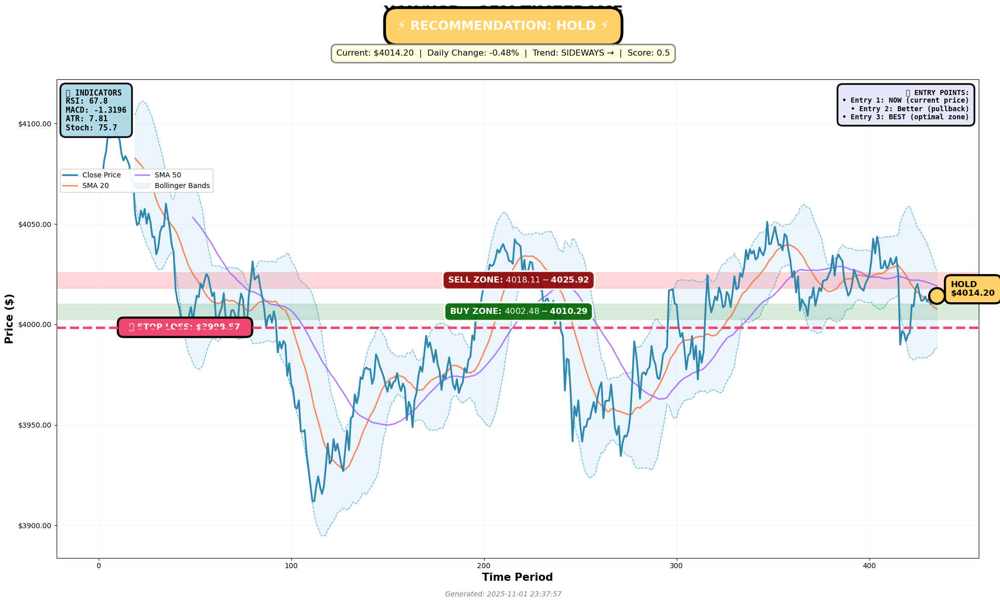

✅ Chart saved: charts/gold/xau_usd_15m_chart.png

📊 Creating 30M chart...
✅ Fetched 264 real data points for GC=F (30m)
✅ Chart saved: charts/gold/xau_usd_30m_chart.png


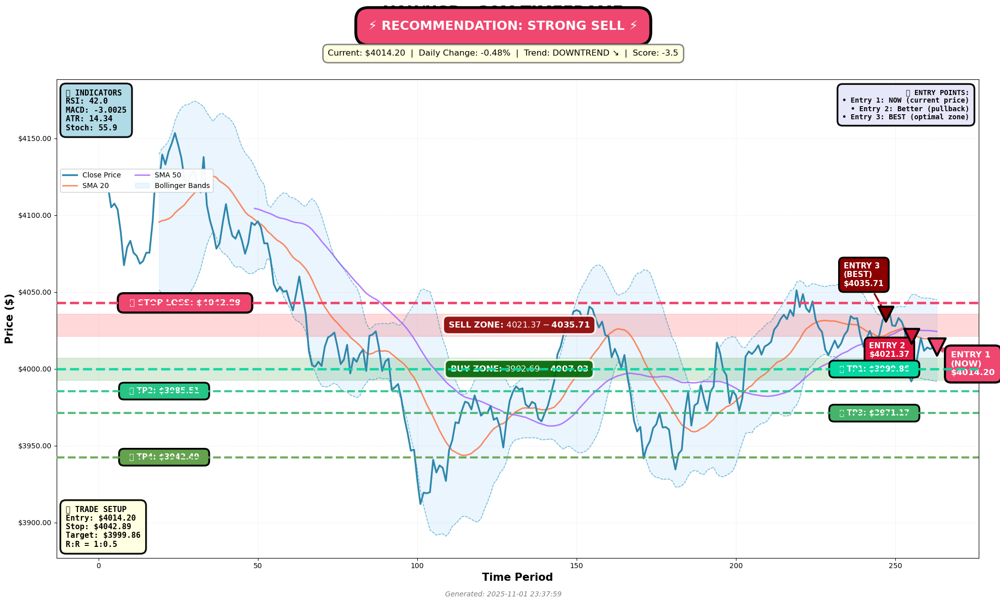


📊 Creating 1H chart...
✅ Fetched 514 real data points for GC=F (1h)
✅ Chart saved: charts/gold/xau_usd_1h_chart.png


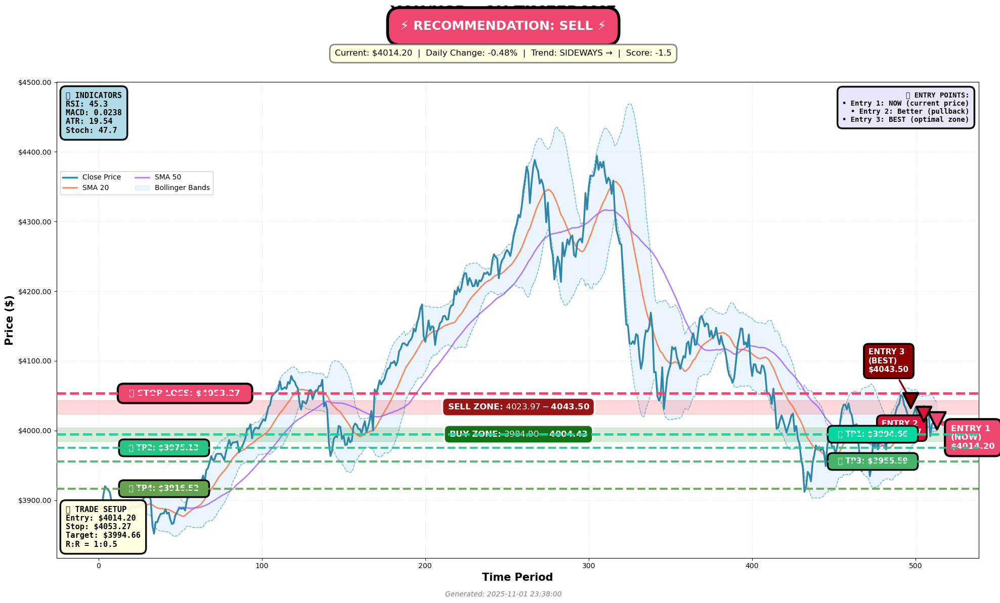


📊 Creating 4H chart...
✅ Fetched 399 real data points for GC=F (4h)
✅ Chart saved: charts/gold/xau_usd_4h_chart.png


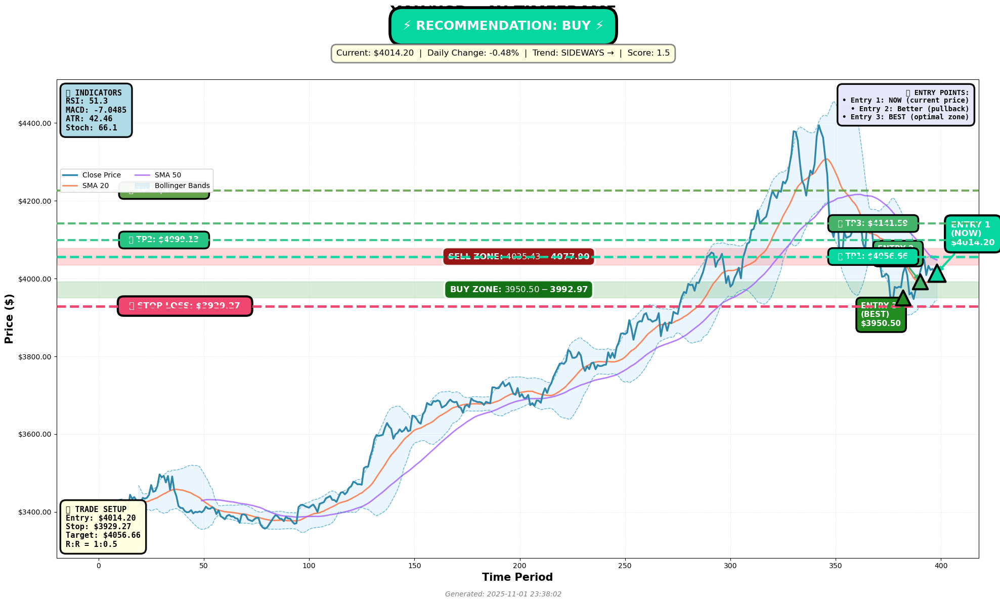

✅ All Gold charts created!

🥈 SILVER (XAG/USD) ANALYSIS

✅ Fetched 436 real data points for SI=F (15m)
✅ Fetched 264 real data points for SI=F (30m)
✅ Fetched 514 real data points for SI=F (1h)
✅ Fetched 399 real data points for SI=F (4h)
FOREX TRADING ANALYSIS - XAG/USD
Analysis Time: 2025-11-01 23:38:05

📅 DAILY SUMMARY:
   Date: 2025-10-31 00:00:00
   Open:  $48.44
   High:  $48.68
   Low:   $47.99
   Close: $47.99
   Volume: 370
   Day Range: $47.99 - $48.68
   Change: 📉 $-0.43 (-0.90%)

📊 15M TIMEFRAME ANALYSIS

💰 CURRENT PRICE LEVELS:
   Open:  $48.29
   High:  $48.30
   Low:   $48.24
   Close: $48.25

🎯 RECOMMENDATION: HOLD
   Signal Score: -0.5

📊 SIGNAL BREAKDOWN:
   🔴 Trend: -2.0
   🟢 Momentum: +1.5
   ⚪ Volatility: +0.0
   ⚪ Strength: +0.0

💵 BUY PRICE RANGES:
   🟢 Strong Buy Zone:  $48.10 (BB Lower)
   🟡 Buy Zone Low:     $48.08
   🟡 Buy Zone High:    $48.19

💵 SELL PRICE RANGES:
   🟡 Sell Zone Low:    $48.31
   🟡 Sell Zone High:   $48.42
   🔴 Strong Sell Zone: $48.44 (BB U

In [5]:
# ============================================================================
# CELL 4: GOLD (XAU/USD) Analysis
# ============================================================================
import io
import sys

print("\n🥇 GOLD (XAU/USD) ANALYSIS\n")

# Initialize Gold Analyzer
gold_analyzer = ForexAnalyzer("XAU/USD")

# Run multi-timeframe analysis
gold_analysis = gold_analyzer.multi_timeframe_analysis()

# Capture output
output_buffer = io.StringIO()
sys.stdout = output_buffer
print_analysis(gold_analysis)
sys.stdout = sys.__stdout__

# Print to screen
output_text = output_buffer.getvalue()
print(output_text)

# Save to file
with open('gold_analysis_report.txt', 'w', encoding='utf-8') as f:
    f.write(output_text)
print("\n✅ Full Gold analysis saved to: gold_analysis_report.txt")

# Create charts for all timeframes
print("\n📊 Creating Gold trading charts...")
create_all_charts(gold_analysis, save_dir="charts/gold")
print("✅ All Gold charts created!")


6555

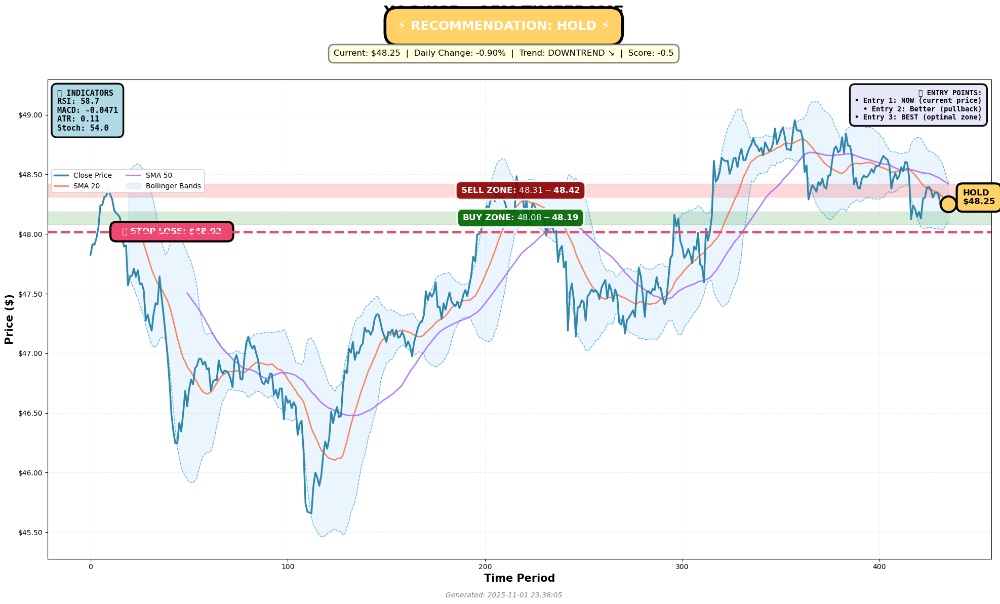

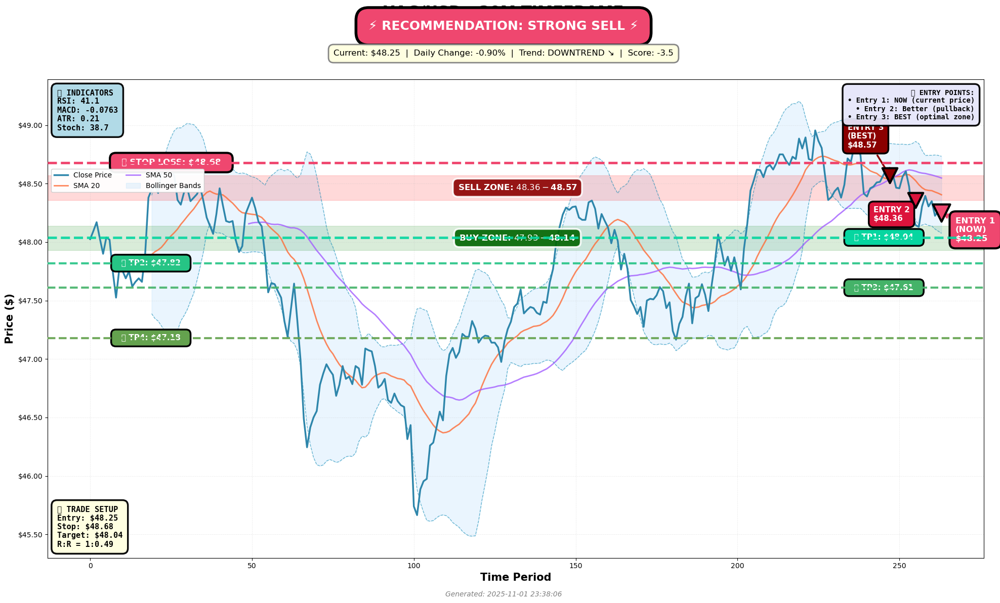

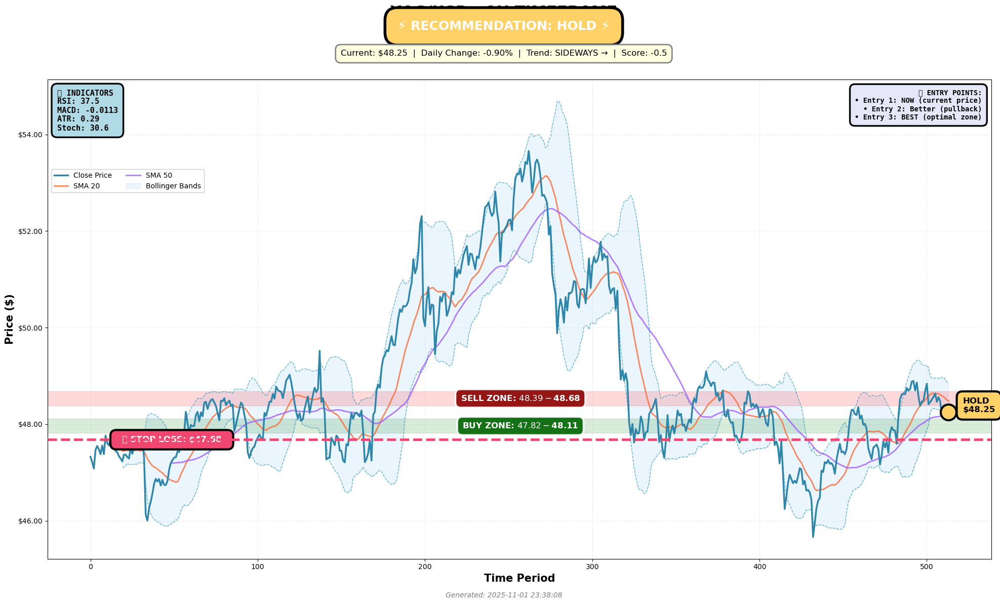

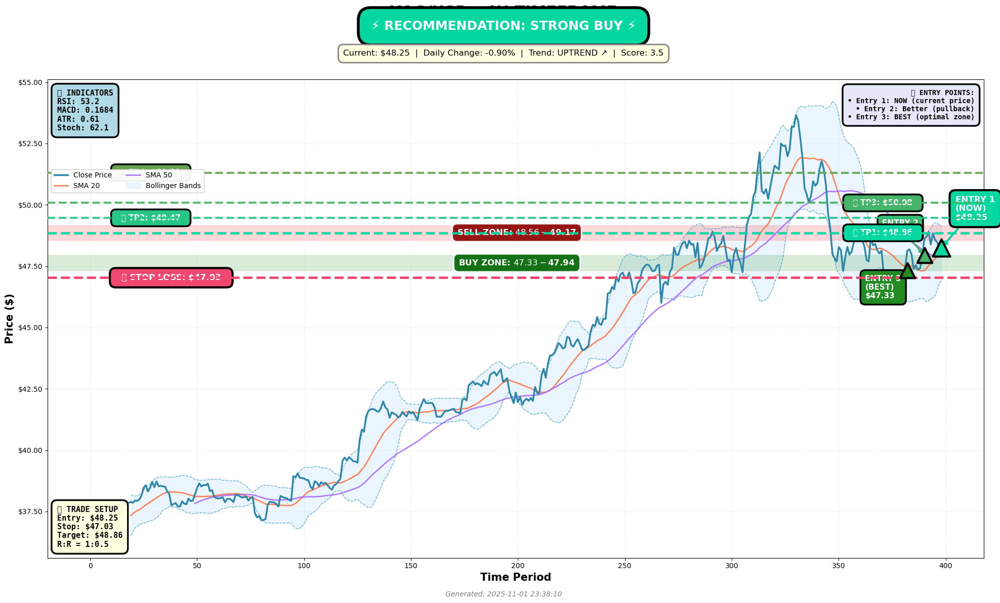

In [6]:
# ============================================================================
# CELL 5: SILVER (XAG/USD) Analysis
# ============================================================================
import io
import sys

print("\n🥈 SILVER (XAG/USD) ANALYSIS\n")

# Initialize Silver Analyzer
silver_analyzer = ForexAnalyzer("XAG/USD")

# Run multi-timeframe analysis
silver_analysis = silver_analyzer.multi_timeframe_analysis()

# Capture output
output_buffer = io.StringIO()
sys.stdout = output_buffer
print_analysis(silver_analysis)
sys.stdout = sys.__stdout__

# Print to screen
output_text = output_buffer.getvalue()
print(output_text)

# Save to file
with open('silver_analysis_report.txt', 'w', encoding='utf-8') as f:
    f.write(output_text)
print("\n✅ Full Silver analysis saved to: silver_analysis_report.txt")

# Create charts
print("\n📊 Creating Silver trading charts...")
create_all_charts(silver_analysis, save_dir="charts/silver")
print("✅ All Silver charts created!")


5752

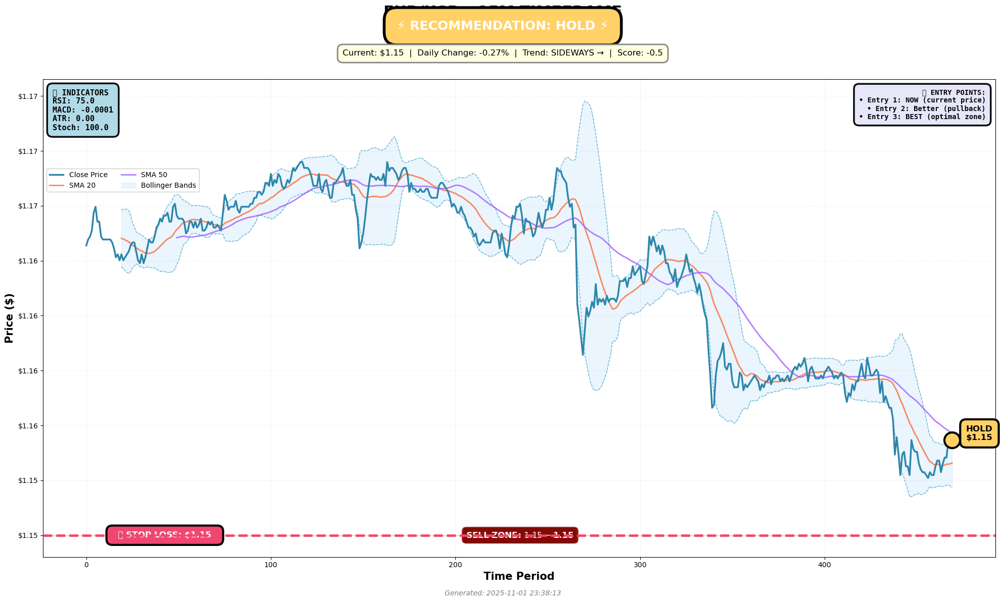

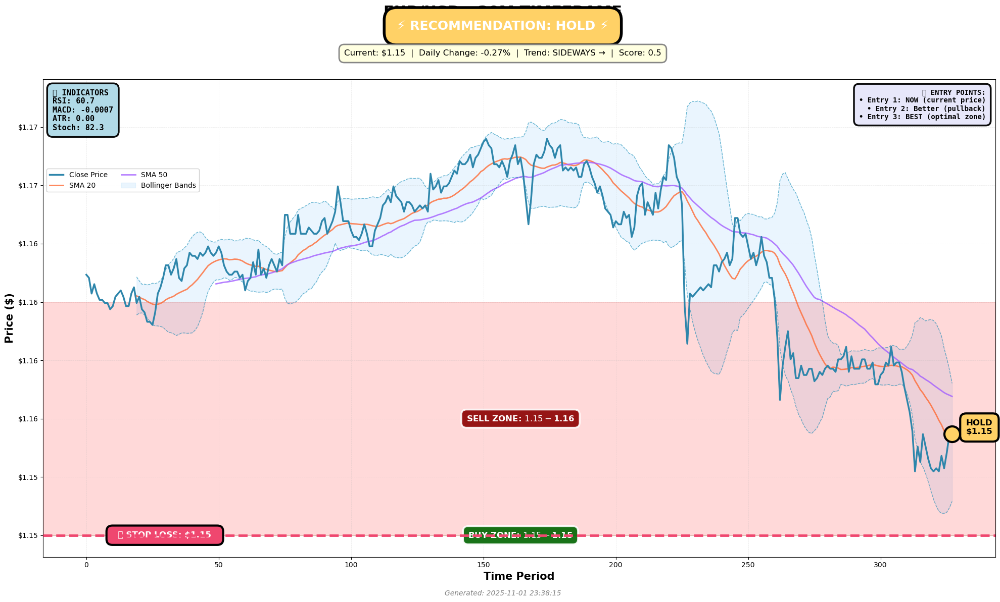

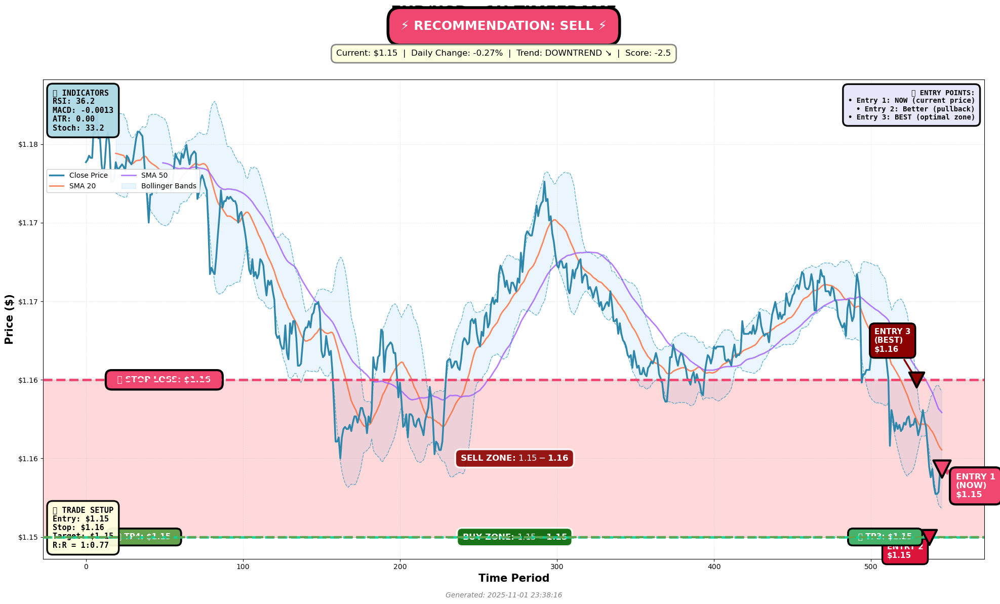

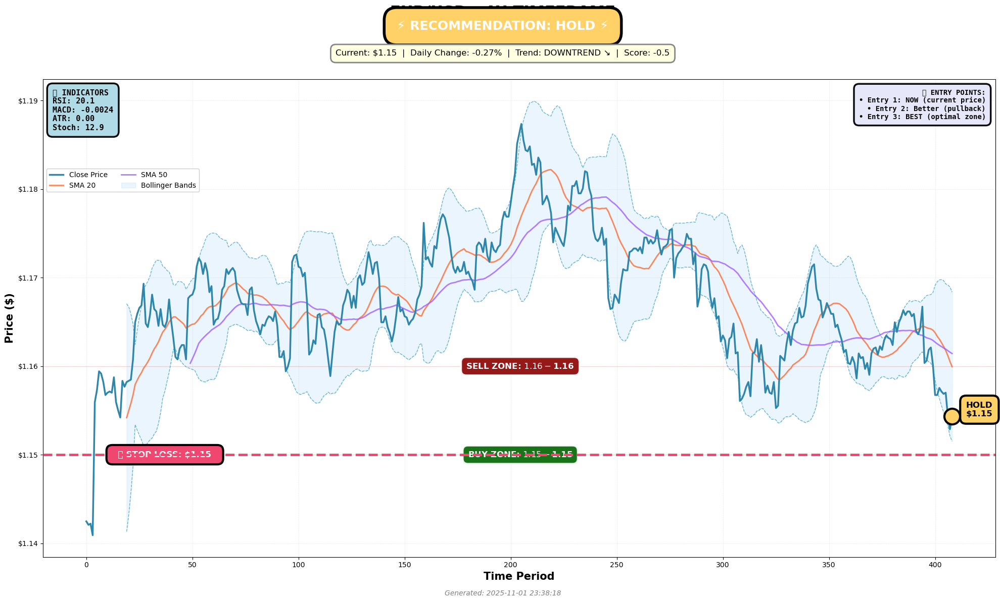

In [7]:
# ============================================================================
# CELL 6: EUR/USD Analysis
# ============================================================================
import io
import sys

print("\n💱 EUR/USD ANALYSIS\n")

# Initialize EUR/USD Analyzer
eur_analyzer = ForexAnalyzer("EUR/USD")

# Run multi-timeframe analysis
eur_analysis = eur_analyzer.multi_timeframe_analysis()

# Capture output
output_buffer = io.StringIO()
sys.stdout = output_buffer
print_analysis(eur_analysis)
sys.stdout = sys.__stdout__

# Print to screen
output_text = output_buffer.getvalue()
print(output_text)

# Save to file
with open('eurusd_analysis_report.txt', 'w', encoding='utf-8') as f:
    f.write(output_text)
print("\n✅ Full EUR/USD analysis saved to: eurusd_analysis_report.txt")

# Create charts
print("\n📊 Creating EUR/USD trading charts...")
create_all_charts(eur_analysis, save_dir="charts/eurusd")
print("✅ All EUR/USD charts created!")

7163

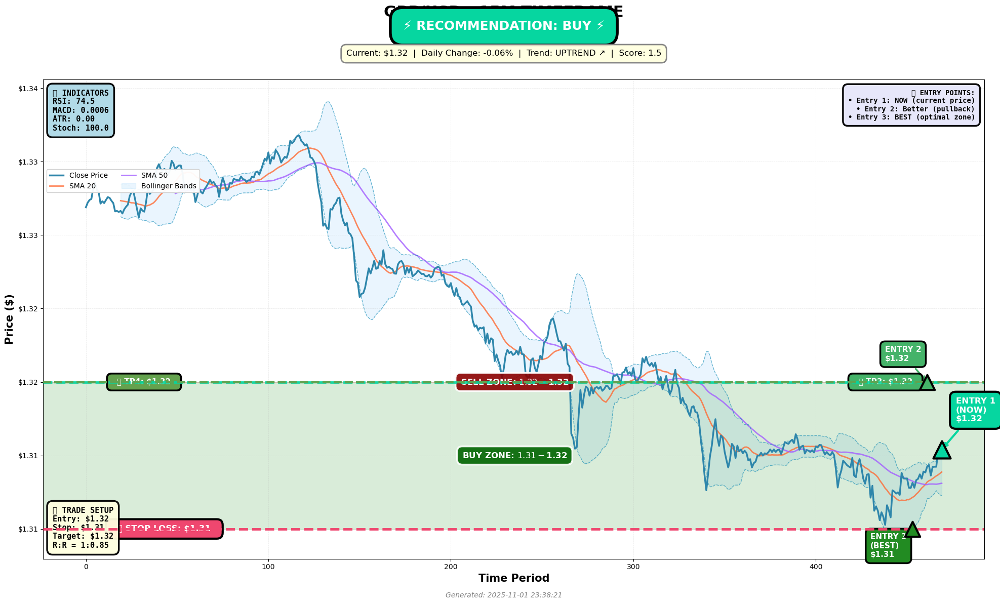

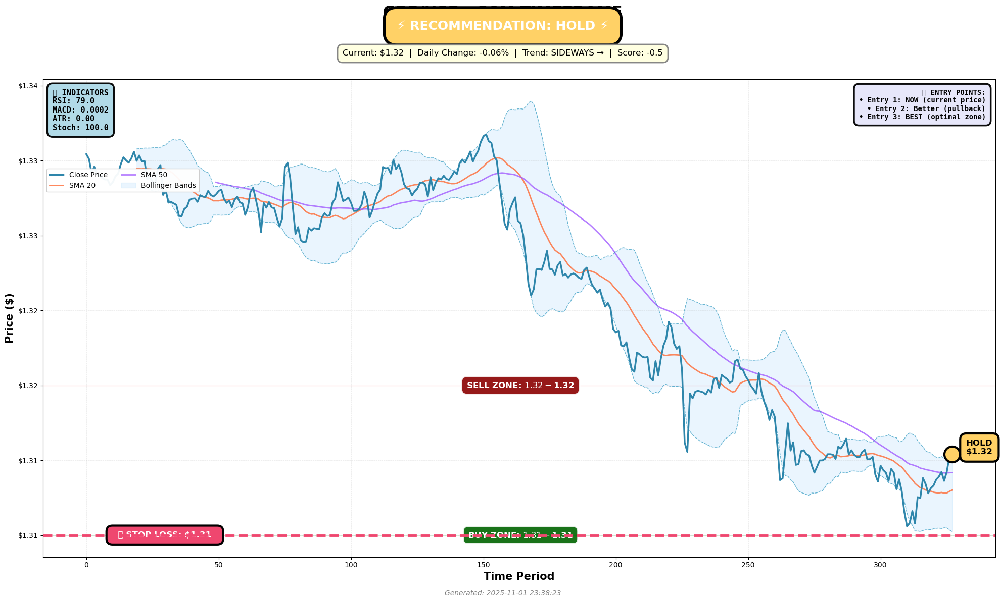

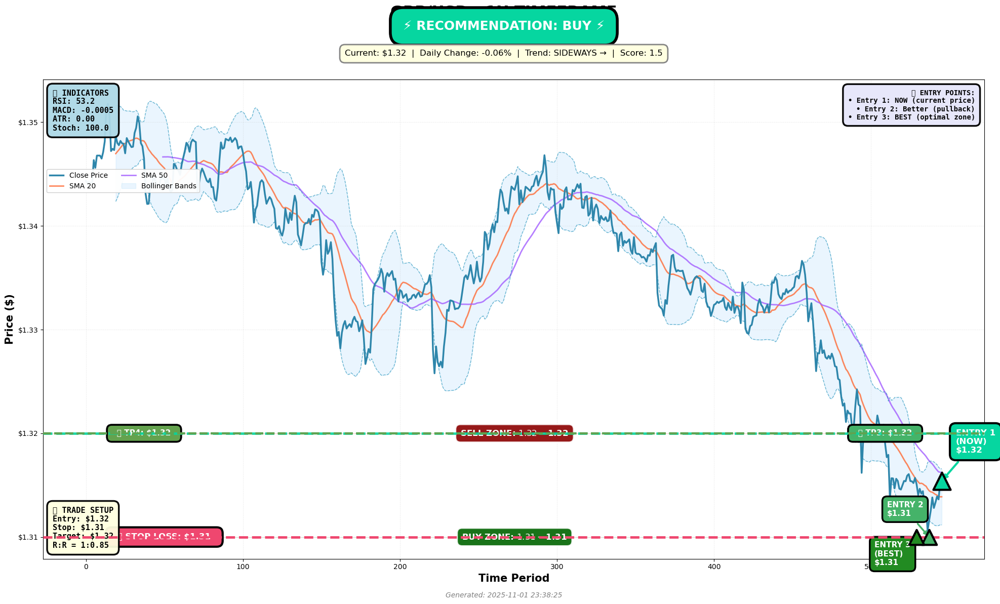

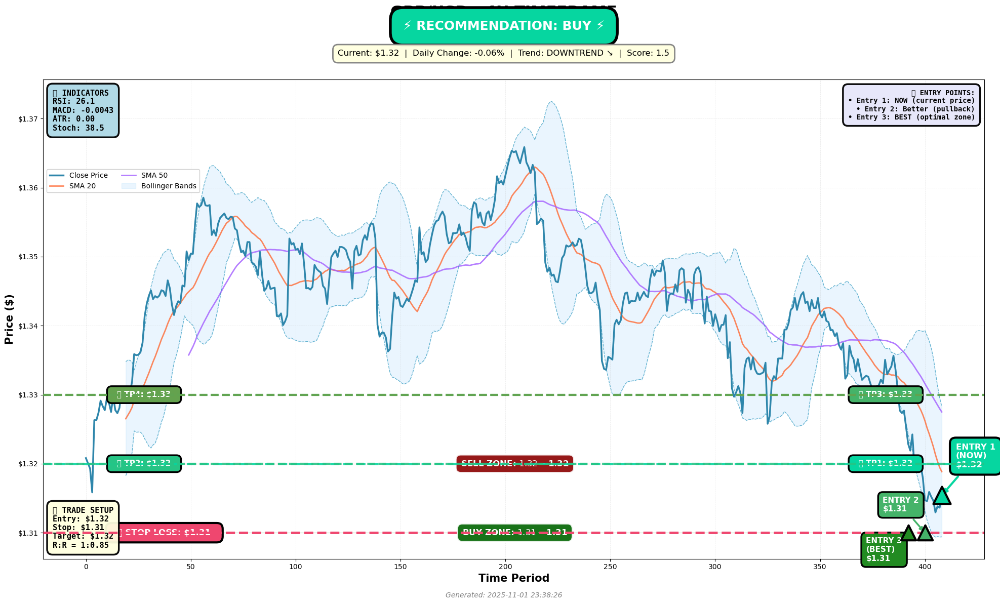

In [8]:
# ============================================================================
# CELL 7: GBP/USD Analysis
# ============================================================================
import io
import sys

print("\n💱 GBP/USD ANALYSIS\n")

# Initialize GBP/USD Analyzer
gbp_analyzer = ForexAnalyzer("GBP/USD")

# Run multi-timeframe analysis
gbp_analysis = gbp_analyzer.multi_timeframe_analysis()

# Capture output
output_buffer = io.StringIO()
sys.stdout = output_buffer
print_analysis(gbp_analysis)
sys.stdout = sys.__stdout__

# Print to screen
output_text = output_buffer.getvalue()
print(output_text)

# Save to file
with open('gbpusd_analysis_report.txt', 'w', encoding='utf-8') as f:
    f.write(output_text)
print("\n✅ Full GBP/USD analysis saved to: gbpusd_analysis_report.txt")

# Create charts
print("\n📊 Creating GBP/USD trading charts...")
create_all_charts(gbp_analysis, save_dir="charts/gbpusd")
print("✅ All GBP/USD charts created!")


In [9]:
# ============================================================================
# CELL 8: Summary Comparison Table
# ============================================================================
print("\n📊 MULTI-ASSET SUMMARY\n")

# Create comparison summary
summary_data = []

for name, analysis in [("Gold", gold_analysis), ("Silver", silver_analysis), 
                        ("EUR/USD", eur_analysis), ("GBP/USD", gbp_analysis)]:
    daily = analysis.get('daily', {})
    summary_data.append({
        'Asset': name,
        'Current Price': f"${daily.get('close', 0):.2f}" if daily else "N/A",
        'Daily Change': f"{daily.get('change_pct', 0):+.2f}%" if daily else "N/A",
        'Consensus': analysis['consensus'],
        'Avg Score': analysis['average_score'],
        '15m': analysis['timeframes']['15m']['recommendation'],
        '30m': analysis['timeframes']['30m']['recommendation'],
        '1h': analysis['timeframes']['1h']['recommendation'],
        '4h': analysis['timeframes']['4h']['recommendation']
    })

summary_df = pd.DataFrame(summary_data)
print("=" * 120)
print("📊 MULTI-ASSET SUMMARY")
print("=" * 120)
print(summary_df.to_string(index=False))
print("=" * 120)

# Detailed price levels table
print("\n" + "=" * 140)
print("💰 PRICE LEVELS & STOP LOSS TARGETS (Based on 1H Timeframe)")
print("=" * 140)
price_levels = []
for name, analysis in [("Gold", gold_analysis), ("Silver", silver_analysis), 
                        ("EUR/USD", eur_analysis), ("GBP/USD", gbp_analysis)]:
    tf_1h = analysis['timeframes']['1h']
    sl = tf_1h.get('stop_loss', {})
    tp = tf_1h.get('take_profit', {})
    
    price_levels.append({
        'Asset': name,
        'Current': f"${tf_1h['price']:.2f}",
        'Stop Loss (2%)': f"${sl.get('percentage_2pct', 0):.2f}",
        'Stop Loss (ATR)': f"${sl.get('atr_based', 0):.2f}",
        'TP1': f"${tp.get('tp1_scalp', 0):.2f}" if tp.get('tp1_scalp') else "N/A",
        'TP2': f"${tp.get('tp2_conservative', 0):.2f}" if tp.get('tp2_conservative') else "N/A",
        'TP3': f"${tp.get('tp3_moderate', 0):.2f}" if tp.get('tp3_moderate') else "N/A",
        'TP4': f"${tp.get('tp4_aggressive', 0):.2f}" if tp.get('tp4_aggressive') else "N/A",
        'R/R': f"1:{tf_1h.get('risk_reward_ratio', 0)}" if tf_1h.get('risk_reward_ratio') else "N/A"
    })

price_df = pd.DataFrame(price_levels)
print(price_df.to_string(index=False))
print("=" * 140)

# Save summary to file
summary_output = io.StringIO()
sys.stdout = summary_output
print("=" * 120)
print("📊 MULTI-ASSET SUMMARY")
print("=" * 120)
print(summary_df.to_string(index=False))
print("=" * 120)
print("\n" + "=" * 140)
print("💰 PRICE LEVELS & STOP LOSS TARGETS (Based on 1H Timeframe)")
print("=" * 140)
print(price_df.to_string(index=False))
print("=" * 140)
sys.stdout = sys.__stdout__

with open('all_assets_summary.txt', 'w', encoding='utf-8') as f:
    f.write(summary_output.getvalue())
print("\n✅ Complete summary saved to: all_assets_summary.txt")

1768

In [10]:
#============================================================================
# CELL 9: Continuous Monitoring (Optional)
# ============================================================================
# Uncomment the code below to enable continuous monitoring

# from IPython.display import clear_output
# import time

# print("🔄 Starting continuous monitoring...")
# print("Press the Stop button to halt\n")

# try:
#     while True:
#         clear_output(wait=True)
#         
#         print(f"🕒 Last Update: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n")
#         
#         # Update Gold
#         gold_analysis = gold_analyzer.multi_timeframe_analysis()
#         print_analysis(gold_analysis)
#         print("\n" * 2)
#         
#         # Update Silver
#         silver_analysis = silver_analyzer.multi_timeframe_analysis()
#         print_analysis(silver_analysis)
#         
#         print("\n⏰ Next update in 5 minutes...")
#         time.sleep(300)  # Wait 5 minutes
#         
# except KeyboardInterrupt:
#     print("\n\n👋 Monitoring stopped.")

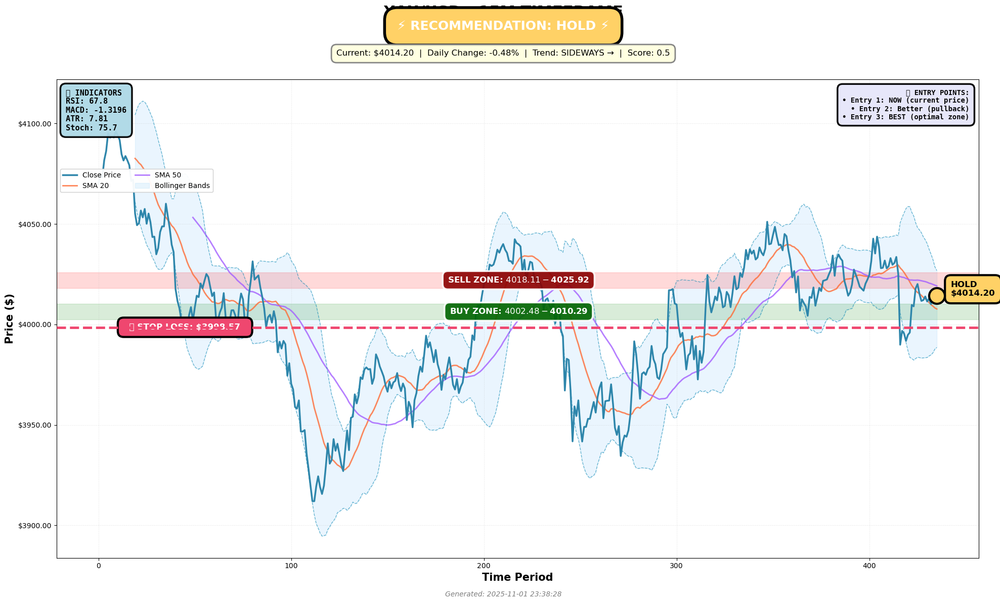

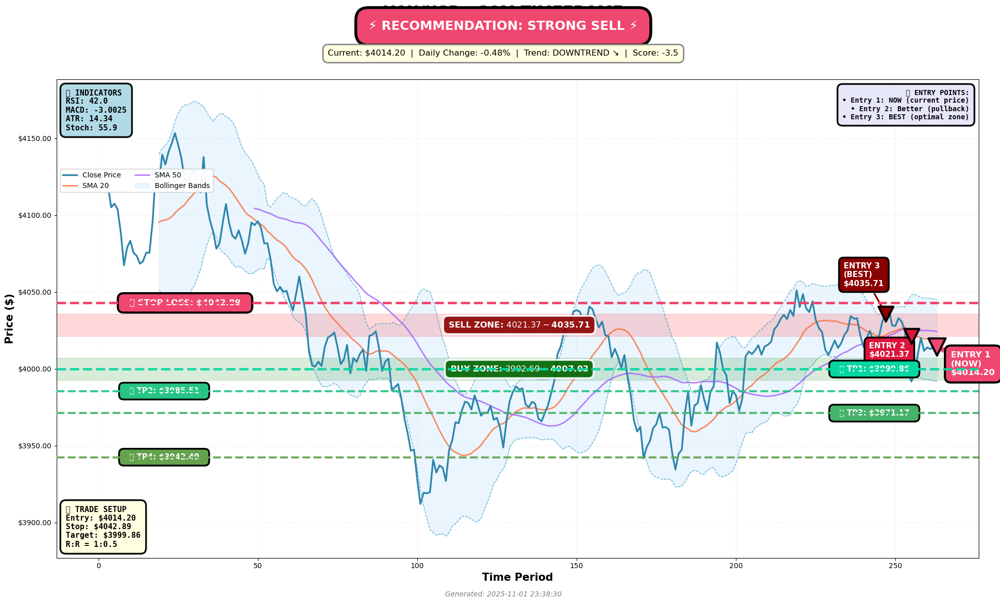

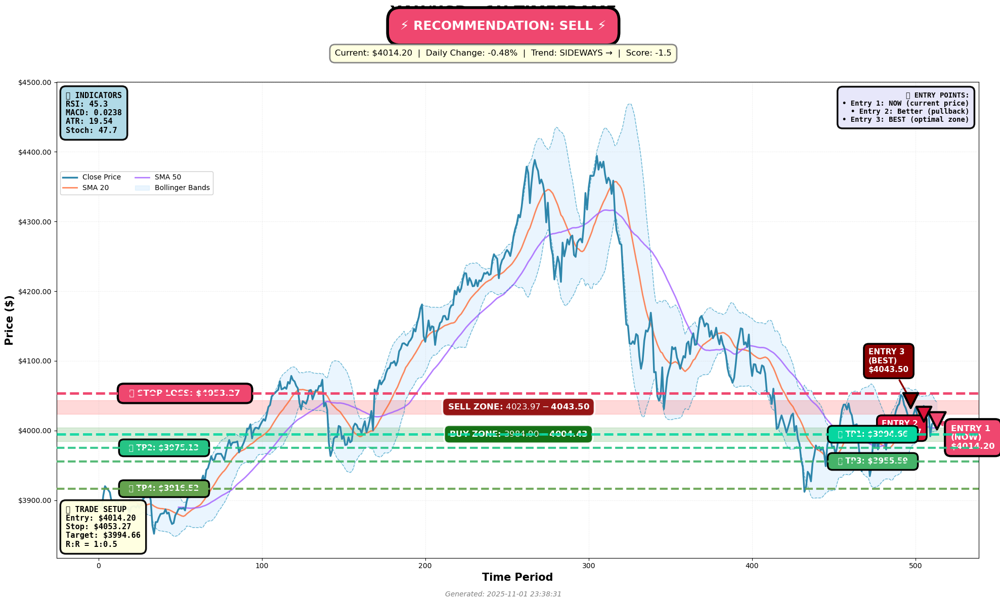

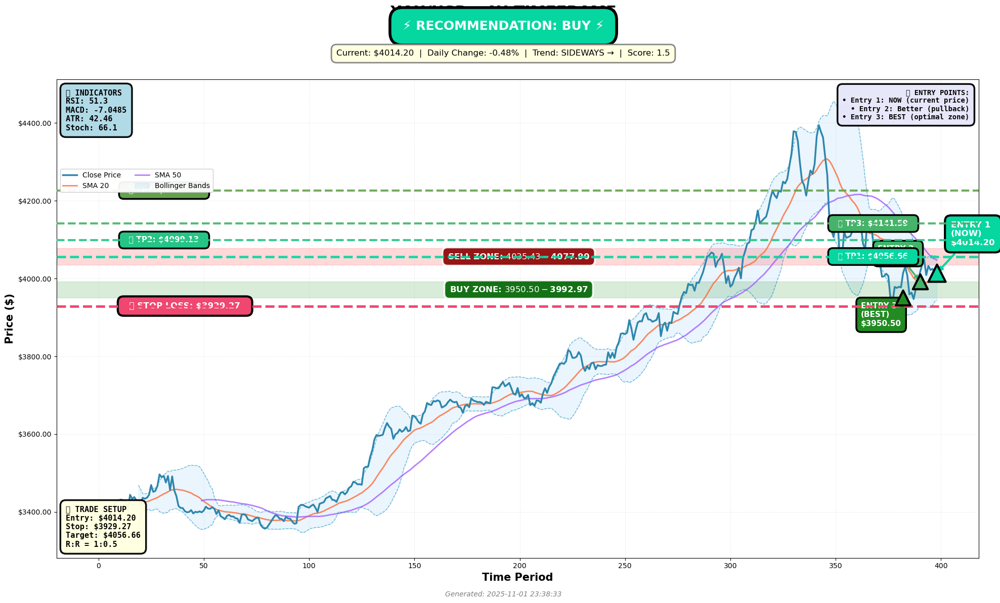

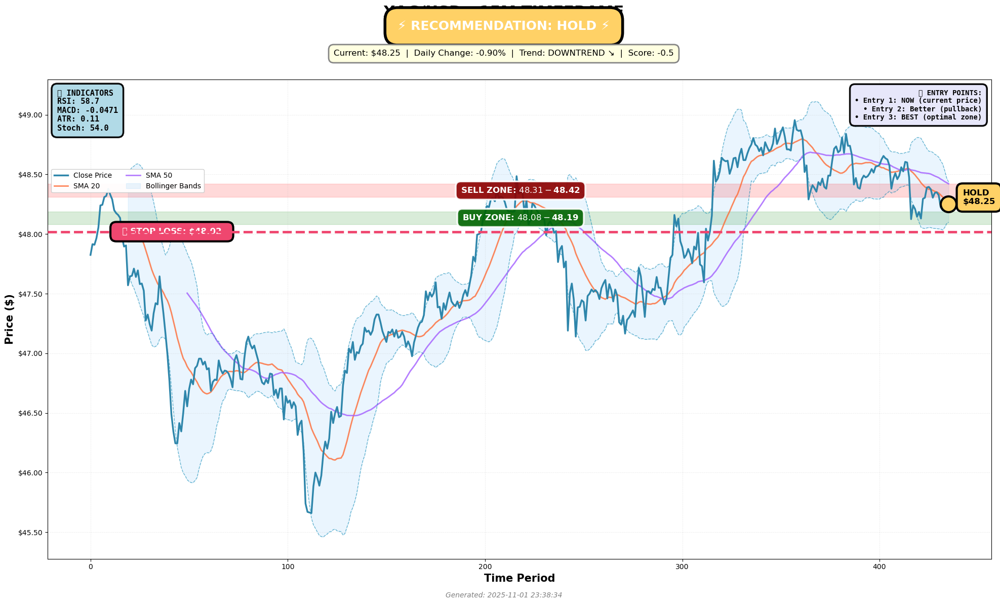

...

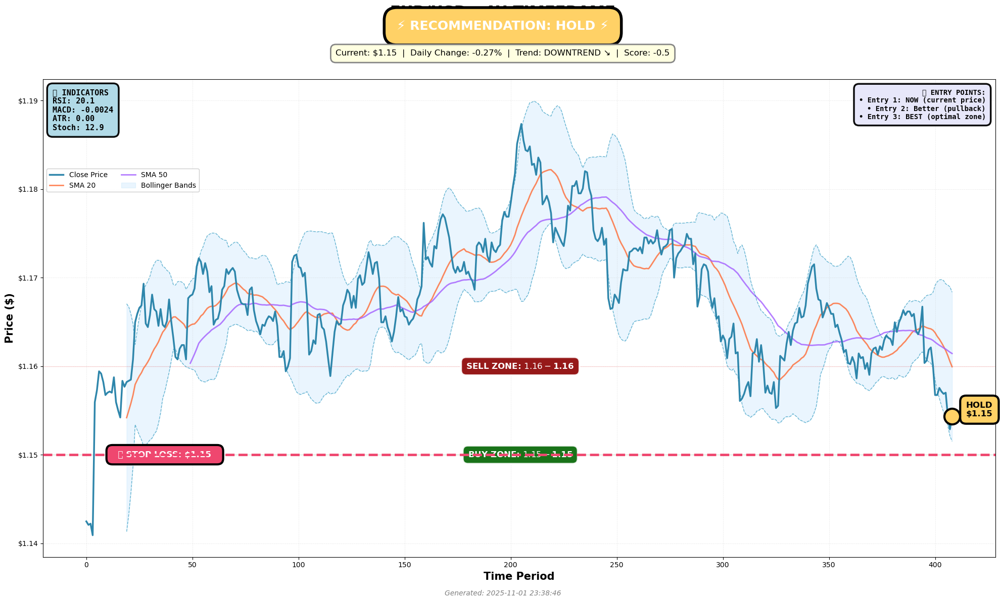

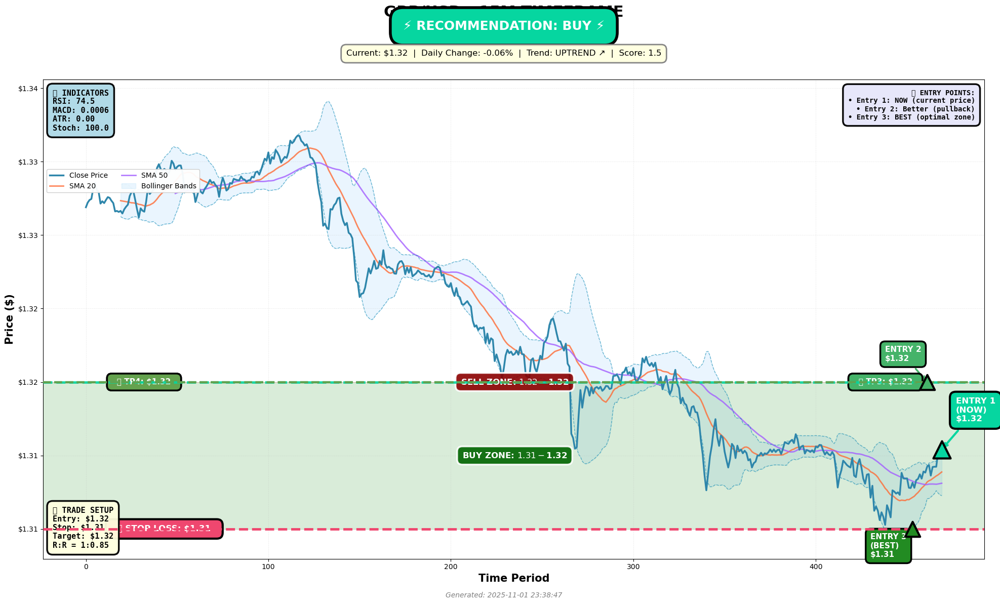

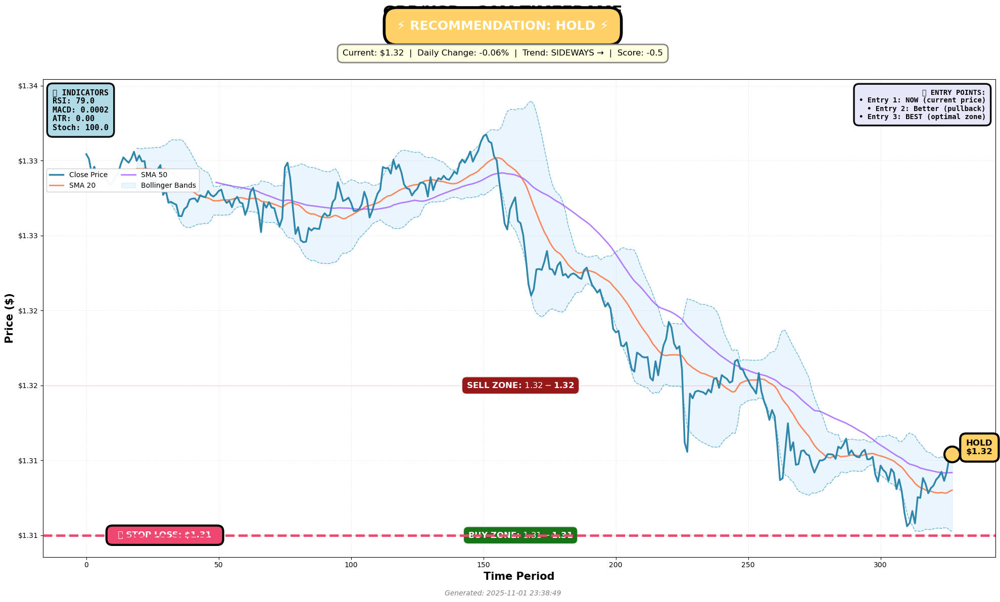

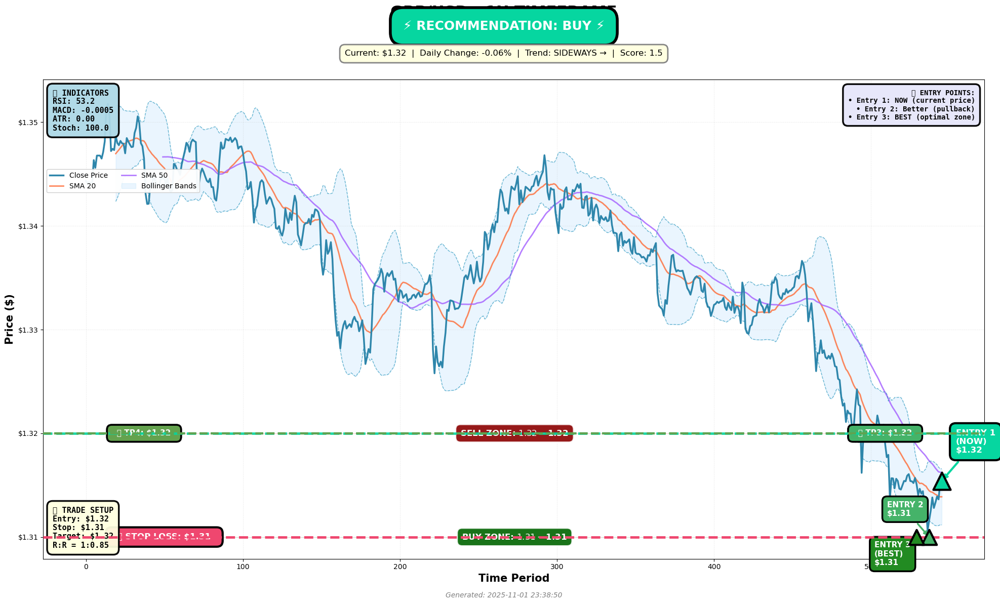

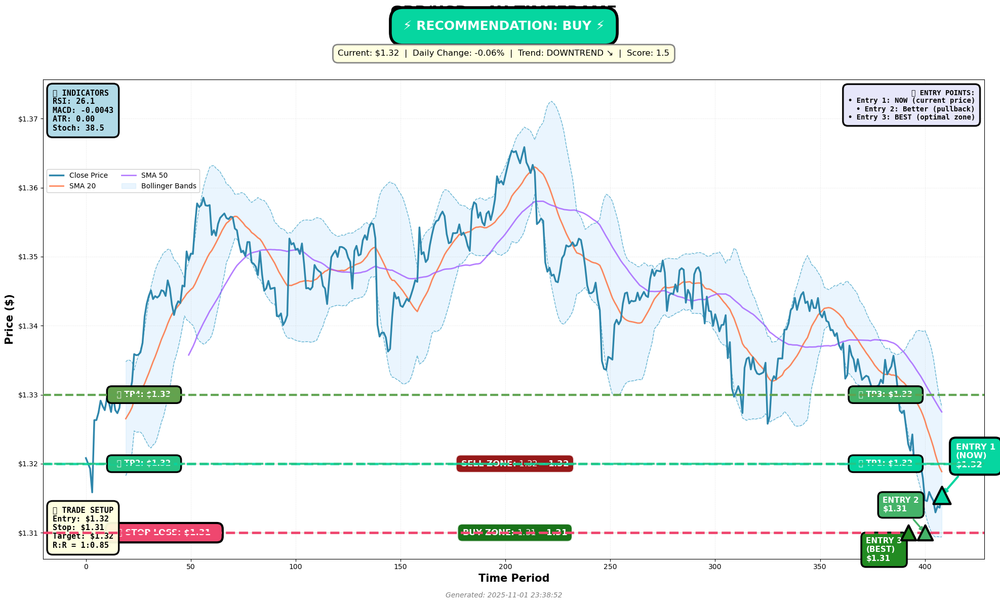

In [11]:
# ============================================================================
# CELL 10: Create All Charts at Once
# ============================================================================
import os

print("\n📊 CREATING ALL TRADING CHARTS\n")
print("=" * 80)

# Create directories
for asset in ['gold', 'silver', 'eurusd', 'gbpusd']:
    os.makedirs(f'charts/{asset}', exist_ok=True)

# Create all charts
assets = [
    ('Gold', gold_analysis),
    ('Silver', silver_analysis),
    ('EUR/USD', eur_analysis),
    ('GBP/USD', gbp_analysis)
]

for asset_name, analysis in assets:
    print(f"\n📈 Creating charts for {asset_name}...")
    print("-" * 80)
    asset_dir = f"charts/{analysis['symbol'].replace('/', '_').lower()}"
    os.makedirs(asset_dir, exist_ok=True)
    create_all_charts(analysis, save_dir=asset_dir)
    print(f"✅ {asset_name} charts complete!\n")

print("=" * 80)
print("🎉 ALL CHARTS CREATED SUCCESSFULLY!")
print("\n📁 Charts saved in:")
print("   - charts/gold/")
print("   - charts/silver/")
print("   - charts/eurusd/")
print("   - charts/gbpusd/")
print("\n💡 Each folder contains 4 charts (15m, 30m, 1h, 4h timeframes)")
print("=" * 80)